<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#fixing-the-data" data-toc-modified-id="fixing-the-data-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>fixing the data</a></span><ul class="toc-item"><li><span><a href="#fix-only-5-6" data-toc-modified-id="fix-only-5-6-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>fix only 5-6</a></span></li><li><span><a href="#reduce-augmentations" data-toc-modified-id="reduce-augmentations-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>reduce augmentations</a></span></li><li><span><a href="#update-index-file-just-for-augmentations" data-toc-modified-id="update-index-file-just-for-augmentations-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>update index file just for augmentations</a></span></li><li><span><a href="#move-to-train-test" data-toc-modified-id="move-to-train-test-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>move to train test</a></span></li><li><span><a href="#fix-all" data-toc-modified-id="fix-all-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>fix all</a></span></li><li><span><a href="#update-index-files-final" data-toc-modified-id="update-index-files-final-1.6"><span class="toc-item-num">1.6&nbsp;&nbsp;</span>update index files final</a></span></li><li><span><a href="#utils-for-fix" data-toc-modified-id="utils-for-fix-1.7"><span class="toc-item-num">1.7&nbsp;&nbsp;</span>utils for fix</a></span></li></ul></li></ul></div>

In [1]:
import cv2
import numpy as np
import random

# Random Rotation
def random_rotation(image, angle_range=(-15, 15)):
    angle = random.uniform(angle_range[0], angle_range[1])
    height, width = image.shape[:2]
    center = (width / 2, height / 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
    return rotated_image

# Random Crop
def random_crop(image, crop_size=(256, 256)):
    height, width = image.shape[:2]
    start_x = random.randint(0, width - crop_size[0])
    start_y = random.randint(0, height - crop_size[1])
    cropped_image = image[start_y:start_y+crop_size[1], start_x:start_x+crop_size[0]]
    return cropped_image

# Color Jitter
def color_jitter(image, brightness_range=(-30, 30), contrast_range=(0.8, 1.2)):
    brightness = random.uniform(brightness_range[0], brightness_range[1])
    contrast = random.uniform(contrast_range[0], contrast_range[1])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    image = np.array(image, dtype=np.float64)
    image[:, :, 2] *= contrast
    image[:, :, 2] += brightness
    image[:, :, 2] = np.clip(image[:, :, 2], 0, 255)
    image = np.array(image, dtype=np.uint8)
    image = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
    return image

# Horizontal Flip
def horizontal_flip(image):
    flipped_image = cv2.flip(image, 1)
    return flipped_image

# Gaussian Blur
def gaussian_blur(image, kernel_size=(5, 5), sigma=0):
    blurred_image = cv2.GaussianBlur(image, kernel_size, sigma)
    return blurred_image

# Random Contrast and Brightness
def random_contrast_brightness(image, contrast_range=(0.8, 1.2), brightness_range=(-30, 30)):
    contrast = random.uniform(contrast_range[0], contrast_range[1])
    brightness = random.uniform(brightness_range[0], brightness_range[1])
    adjusted_image = np.clip(image * contrast + brightness, 0, 255).astype(np.uint8)
    return adjusted_image

# Random Noise
def random_noise(image, noise_type='gaussian', mean=0, std=10):
    if noise_type == 'gaussian':
        noise = np.random.normal(mean, std, image.shape).astype(np.uint8)
    elif noise_type == 'salt_and_pepper':
        noise = np.zeros_like(image)
        salt_pixels = random.randint(200, 1000)
        pepper_pixels = random.randint(200, 1000)
        salt_coords = [np.random.randint(0, i - 1, int(salt_pixels)) for i in image.shape]
        pepper_coords = [np.random.randint(0, i - 1, int(pepper_pixels)) for i in image.shape]
        noise[tuple(salt_coords)] = 255
        noise[tuple(pepper_coords)] = 0
    noisy_image = cv2.add(image, noise)
    return noisy_image

# Elastic Transformations
def elastic_transform(image, alpha_range=(30, 70), sigma_range=(5, 9)):
    alpha = random.randint(alpha_range[0], alpha_range[1])
    sigma = random.uniform(sigma_range[0], sigma_range[1])
    random_state = np.random.RandomState(None)
    shape = image.shape
    dx = cv2.GaussianBlur((random_state.rand(*shape) * 2 - 1), (0, 0), sigma) * alpha
    dy = cv2.GaussianBlur((random_state.rand(*shape) * 2 - 1), (0, 0), sigma) * alpha
    dz = np.zeros_like(dx)
    x, y, z = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]), np.arange(shape[2]))
    indices = np.reshape(y+dy, (-1, 1)), np.reshape(x+dx, (-1, 1)), np.reshape(z+dz, (-1, 1))
    transformed_image = cv2.remap(image, *indices, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)
    return transformed_image

# Example usage
image = cv2.imread(r"C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\8614_1637053581.jpg")

# Apply augmentations
augmented_image = random_rotation(image)
augmented_image = random_crop(augmented_image)
augmented_image = color_jitter(augmented_image)
augmented_image = horizontal_flip(augmented_image)
augmented_image = gaussian_blur(augmented_image)
augmented_image = random_contrast_brightness(augmented_image)
augmented_image = random_noise(augmented_image)
augmented_image = elastic_transform(augmented_image)

# Display the augmented image
cv2.imshow("Augmented Image", augmented_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


error: OpenCV(4.5.5) :-1: error: (-5:Bad argument) in function 'remap'
> Overload resolution failed:
>  - argument for remap() given by name ('interpolation') and position (4)
>  - argument for remap() given by name ('interpolation') and position (4)


In [2]:
from scipy.ndimage import map_coordinates

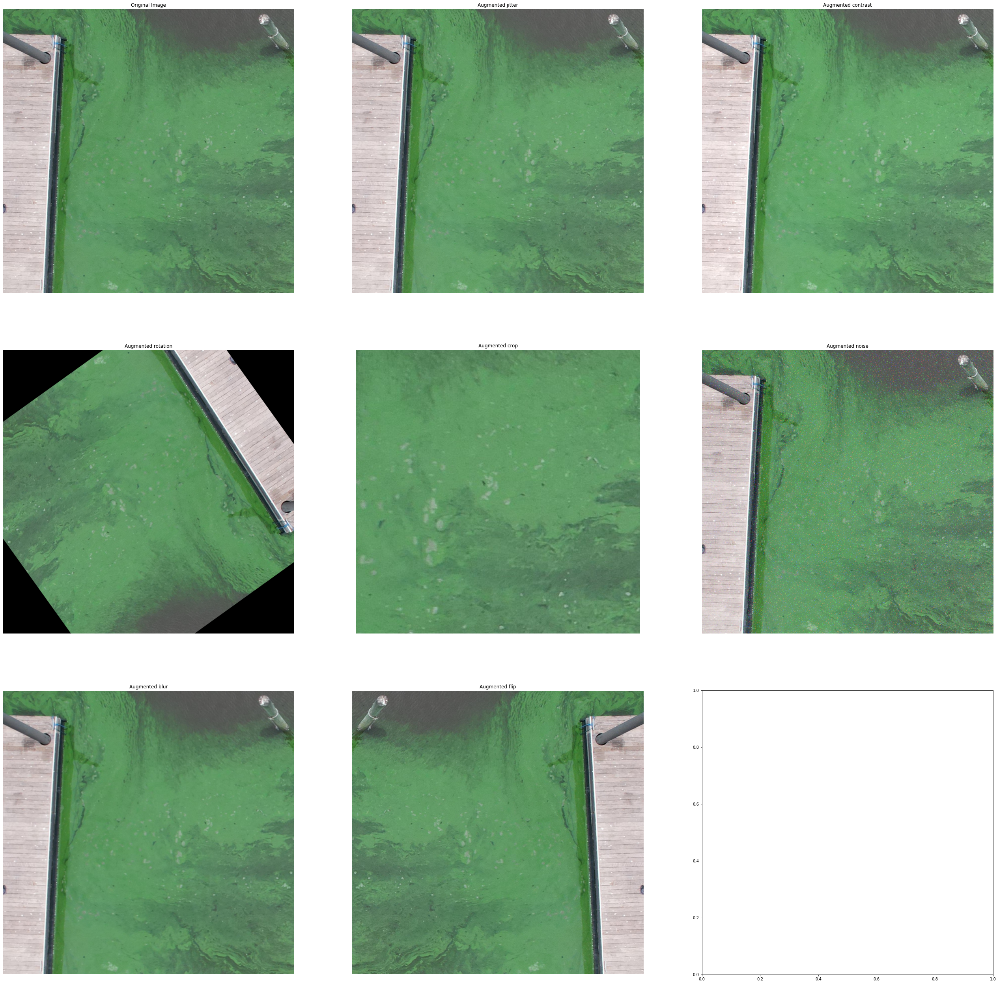

In [382]:
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
# Elastic Transformations
from scipy.ndimage import gaussian_filter, map_coordinates
# Color Jitter
def color_jitter(image, brightness_range=(-30, 30), contrast_range=(0.8, 1.2)):
    brightness = random.uniform(brightness_range[0], brightness_range[1])
    contrast = random.uniform(contrast_range[0], contrast_range[1])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    image = np.array(image, dtype=np.float64)
    image[:, :, 1] *= contrast  # Modify saturation channel for green shades
    image[:, :, 2] += brightness  # Modify value channel for brightness
    image[:, :, 2] = np.clip(image[:, :, 2], 0, 255)
    image = np.array(image, dtype=np.uint8)
    image = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
    return image

# Random Contrast and Brightness
def random_contrast_brightness(image, contrast_range=(0.8, 1.2), brightness_range=(-30, 30)):
    contrast = random.uniform(contrast_range[0], contrast_range[1])
    brightness = random.uniform(brightness_range[0], brightness_range[1])
    adjusted_image = np.clip(image * contrast + brightness, 0, 255).astype(np.uint8)
    return adjusted_image

# Random Rotation
def random_rotation(image, angle_range=(-360, 360)):
    angle = random.uniform(angle_range[0], angle_range[1])
    height, width = image.shape[:2]
    center = (width / 2, height / 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
    return rotated_image

# Random Crop
def random_crop(image, crop_size_factor=0.5, crop_center=None):
    height, width, _ = image.shape

    if crop_center is None:
        # Calculate the crop center coordinates
        crop_center_x = random.randint(int(width * 0.25), int(width * 0.75))
        crop_center_y = random.randint(int(height * 0.25), int(height * 0.75))
    else:
        crop_center_x, crop_center_y = crop_center

    # Calculate the crop size
    crop_size = int(min(width, height) * crop_size_factor)

    # Calculate the crop boundaries
    left = crop_center_x - crop_size // 2
    top = crop_center_y - crop_size // 2
    right = left + crop_size
    bottom = top + crop_size

    # Perform the crop
    cropped_image = image[top:bottom, left:right, :]

    return cropped_image
# Horizontal Flip
def horizontal_flip(image):
    flipped_image = cv2.flip(image, 1)
    return flipped_image

# Gaussian Blur
def gaussian_blur(image, kernel_size=(5, 5), sigma=0):
    blurred_image = cv2.GaussianBlur(image, kernel_size, sigma)
    return blurred_image


# Random Noise
def random_noise(image, noise_type='gaussian', mean=0, std=0.5):
    if noise_type == 'gaussian':
        noise = np.random.normal(mean, std, image.shape).astype(np.uint8)
    elif noise_type == 'salt_and_pepper':
        noise = np.zeros_like(image)
        salt_pixels = random.randint(1, 10)
        pepper_pixels = random.randint(1, 10)
        salt_coords = [np.random.randint(0, i - 1, int(salt_pixels)) for i in image.shape]
        pepper_coords = [np.random.randint(0, i - 1, int(pepper_pixels)) for i in image.shape]
        noise[tuple(salt_coords)] = 255
        noise[tuple(pepper_coords)] = 0
    noisy_image = cv2.add(image, noise)
    return noisy_image


# Example usage
image = cv2.imread(r"C:\Users\urial\BG\AlphaBravo\work\DJI_0032_.JPG")

# Apply augmentations
augmented_jitter = color_jitter(image)
augmented_contrast = random_contrast_brightness(image)
augmented_rotation = random_rotation(image)
augmented_crop = random_crop(image)
augmented_noise = random_noise(image)
augmented_flip = horizontal_flip(image)
augmented_blur = gaussian_blur(image)
# Display the augmented images
fig, axes = plt.subplots(3, 3, figsize=(45, 45))
axes[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("Original Image")
axes[0, 0].axis("off")
axes[0, 1].imshow(cv2.cvtColor(augmented_jitter, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title("Augmented jitter")
axes[0, 1].axis("off")
axes[0, 2].imshow(cv2.cvtColor(augmented_contrast, cv2.COLOR_BGR2RGB))
axes[0, 2].set_title("Augmented contrast")
axes[0, 2].axis("off")

axes[1, 0].imshow(cv2.cvtColor(augmented_rotation, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title("Augmented rotation")
axes[1, 0].axis("off")
axes[1, 1].imshow(cv2.cvtColor(augmented_crop, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title("Augmented crop")
axes[1, 1].axis("off")
axes[1, 2].imshow(cv2.cvtColor(augmented_noise, cv2.COLOR_BGR2RGB))
axes[1, 2].set_title("Augmented noise")
axes[1, 2].axis("off")
axes[2, 0].imshow(cv2.cvtColor(augmented_blur, cv2.COLOR_BGR2RGB))
axes[2, 0].set_title("Augmented blur")
axes[2, 0].axis("off")
axes[2, 1].imshow(cv2.cvtColor(augmented_flip, cv2.COLOR_BGR2RGB))
axes[2, 1].set_title("Augmented flip")
axes[2, 1].axis("off")
plt.show()


In [5]:
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
# Elastic Transformations
from scipy.ndimage import gaussian_filter, map_coordinates
# Color Jitter
def color_jitter(image, brightness_range=(-30, 30), contrast_range=(0.8, 1.2)):
    brightness = random.uniform(brightness_range[0], brightness_range[1])
    contrast = random.uniform(contrast_range[0], contrast_range[1])
#     image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    image = np.array(image, dtype=np.float64)
    image[:, :, 1] *= contrast  # Modify saturation channel for green shades
    image[:, :, 2] += brightness  # Modify value channel for brightness
    image[:, :, 2] = np.clip(image[:, :, 2], 0, 255)
    image = np.array(image, dtype=np.uint8)
    image = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
    return image

# Random Contrast and Brightness
def random_contrast_brightness(image, contrast_range=(0.8, 1.2), brightness_range=(-30, 30)):
    contrast = random.uniform(contrast_range[0], contrast_range[1])
    brightness = random.uniform(brightness_range[0], brightness_range[1])
    adjusted_image = np.clip(image * contrast + brightness, 0, 255).astype(np.uint8)
    return adjusted_image

# Random Rotation
def random_rotation(image, angle_range=(-360, 360)):
    angle = random.uniform(angle_range[0], angle_range[1])
    height, width = image.shape[:2]
    center = (width / 2, height / 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
    return rotated_image

# Random Crop
def random_crop(image, crop_size_factor=0.5, crop_center=None):
    height, width, _ = image.shape

    if crop_center is None:
        # Calculate the crop center coordinates
        crop_center_x = random.randint(int(width * 0.25), int(width * 0.75))
        crop_center_y = random.randint(int(height * 0.25), int(height * 0.75))
    else:
        crop_center_x, crop_center_y = crop_center

    # Calculate the crop size
    crop_size = int(min(width, height) * crop_size_factor)

    # Calculate the crop boundaries
    left = crop_center_x - crop_size // 2
    top = crop_center_y - crop_size // 2
    right = left + crop_size
    bottom = top + crop_size

    # Perform the crop
    cropped_image = image[top:bottom, left:right, :]

    return cropped_image
# Horizontal Flip
def horizontal_flip(image):
    flipped_image = cv2.flip(image, 1)
    return flipped_image

# Gaussian Blur
def gaussian_blur(image, kernel_size=(5, 5), sigma=0):
    blurred_image = cv2.GaussianBlur(image, kernel_size, sigma)
    return blurred_image


# Random Noise
def random_noise(image, noise_type='gaussian', mean=0, std=0.5):
    if noise_type == 'gaussian':
        noise = np.random.normal(mean, std, image.shape).astype(np.uint8)
    elif noise_type == 'salt_and_pepper':
        noise = np.zeros_like(image)
        salt_pixels = random.randint(1, 10)
        pepper_pixels = random.randint(1, 10)
        salt_coords = [np.random.randint(0, i - 1, int(salt_pixels)) for i in image.shape]
        pepper_coords = [np.random.randint(0, i - 1, int(pepper_pixels)) for i in image.shape]
        noise[tuple(salt_coords)] = 255
        noise[tuple(pepper_coords)] = 0
    noisy_image = cv2.add(image, noise)
    return noisy_image
# Example usage
image = cv2.imread(r"C:\Users\urial\OneDrive\שולחן העבודה\augment.jpg")

# Apply augmentations
augmented_jitter = color_jitter(image)
augmented_contrast = random_contrast_brightness(image)
augmented_rotation = random_rotation(image)
augmented_crop = random_crop(image)
augmented_noise = random_noise(image)
augmented_flip = horizontal_flip(image)
augmented_blur = gaussian_blur(image)
# Display the augmented images
fig, axes = plt.subplots(3, 3, figsize=(45, 45))
axes[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("Original Image")
axes[0, 0].axis("off")
axes[0, 1].imshow(cv2.cvtColor(augmented_jitter, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title("Augmented jitter")
axes[0, 1].axis("off")
axes[0, 2].imshow(cv2.cvtColor(augmented_contrast, cv2.COLOR_BGR2RGB))
axes[0, 2].set_title("Augmented contrast")
axes[0, 2].axis("off")

axes[1, 0].imshow(cv2.cvtColor(augmented_rotation, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title("Augmented rotation")
axes[1, 0].axis("off")
axes[1, 1].imshow(cv2.cvtColor(augmented_crop, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title("Augmented crop")
axes[1, 1].axis("off")
axes[1, 2].imshow(cv2.cvtColor(augmented_noise, cv2.COLOR_BGR2RGB))
axes[1, 2].set_title("Augmented noise")
axes[1, 2].axis("off")
axes[2, 0].imshow(cv2.cvtColor(augmented_blur, cv2.COLOR_BGR2RGB))
axes[2, 0].set_title("Augmented blur")
axes[2, 0].axis("off")
axes[2, 1].imshow(cv2.cvtColor(augmented_flip, cv2.COLOR_BGR2RGB))
axes[2, 1].set_title("Augmented flip")
axes[2, 1].axis("off")
plt.show()

IndexError: too many indices for array: array is 0-dimensional, but 3 were indexed

In [4]:
# image = cv2.imread(r"C:\Users\urial\BG\AlphaBravo\work\frame_1.jpg")
augmented_jitter1 = color_jitter(image)
augmented_jitter2 = color_jitter(image)
augmented_jitter3 = color_jitter(image)

fig, axes = plt.subplots(4, 1, figsize=(15, 20))
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")
axes[3].axis("off")
axes[1].imshow(cv2.cvtColor(augmented_jitter1, cv2.COLOR_BGR2RGB))
axes[1].set_title("Augmented jitter_1")
axes[2].imshow(cv2.cvtColor(augmented_jitter2, cv2.COLOR_BGR2RGB))
axes[2].set_title("Augmented jitter_2")
axes[3].imshow(cv2.cvtColor(augmented_jitter3, cv2.COLOR_BGR2RGB))
axes[3].set_title("Augmented jitter_3")

error: OpenCV(4.5.5) D:\bld\libopencv_1654062718948\work\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


Text(0.5, 1.0, 'Augmented jitter_3')

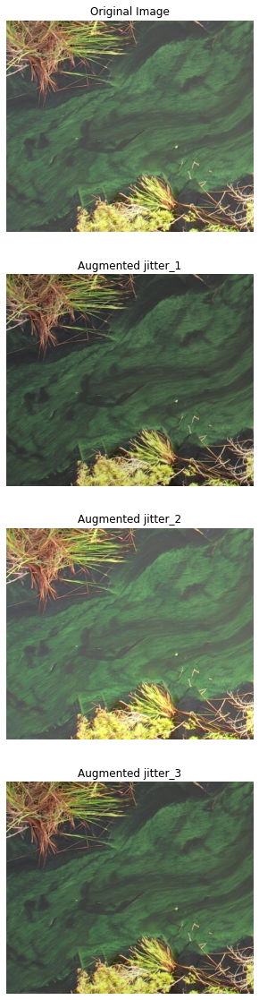

In [395]:
image = cv2.imread(r"C:\Users\urial\BG\AlphaBravo\work\frame_1.jpg")
augmented_jitter1 = color_jitter(image)
augmented_jitter2 = color_jitter(image)
augmented_jitter3 = color_jitter(image)

fig, axes = plt.subplots(4, 1, figsize=(15, 20))
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")
axes[3].axis("off")
axes[1].imshow(cv2.cvtColor(augmented_jitter1, cv2.COLOR_BGR2RGB))
axes[1].set_title("Augmented jitter_1")
axes[2].imshow(cv2.cvtColor(augmented_jitter2, cv2.COLOR_BGR2RGB))
axes[2].set_title("Augmented jitter_2")
axes[3].imshow(cv2.cvtColor(augmented_jitter3, cv2.COLOR_BGR2RGB))
axes[3].set_title("Augmented jitter_3")


In [ ]:
image = cv2.imread(r"C:\Users\urial\BG\AlphaBravo\work\frame_1.jpg")
augmented_jitter1 = color_jitter(image)
augmented_jitter2 = color_jitter(image)
augmented_jitter3 = color_jitter(image)

fig, axes = plt.subplots(4, 1, figsize=(15, 20))
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
# axes[0].axis("off")
axes[1].imshow(cv2.cvtColor(augmented_jitter1, cv2.COLOR_BGR2RGB))
axes[1].set_title("Augmented jitter_1")
axes[2].imshow(cv2.cvtColor(augmented_jitter2, cv2.COLOR_BGR2RGB))
axes[2].set_title("Augmented jitter_2")
axes[3].imshow(cv2.cvtColor(augmented_jitter3, cv2.COLOR_BGR2RGB))
axes[3].set_title("Augmented jitter_3")


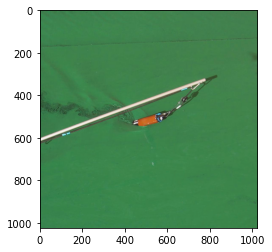

In [131]:

image = cv2.imread(r"C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\8614_1637053581.jpg")
tran = RandomTransform_contrast_brightness()
# Apply augmentation
augmented_image = apply_augmentation(image.copy())
#         augmented_image= np.asarray(augmented_image)
augmented_image= pi(augmented_image)
augmented_image_2 = tran(augmented_image.copy())
# Convert back to NumPy array
# augmented_image_2 = np.asarray(augmented_image_2)

plt.imshow(augmented_image_2)

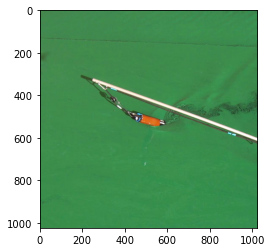

In [87]:

augmented_contrast = random_contrast_brightness(image)
plt.imshow(augmented_contrast)

In [1]:
def horizontal_flip(image):
    code = random.choice([-1,0,1])
    flipped_image = cv2.flip(image, code)
    return flipped_image
# Random Rotation
def random_rotation(image, angle_range=(0,180)):
    angle = random.uniform(angle_range[0], angle_range[1])
    height, width = image.shape[:2]
    center = (width / 2, height / 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
    return rotated_image

augmented_flip = horizontal_flip(image)
image_aug = random_rotation(augmented_flip)
plt.imshow(image_aug)

NameError: name 'image' is not defined

In [133]:
import os
import random
import cv2

# Define augmentation functions
def horizontal_flip(image):
    code = random.choice([-1, 0, 1])
    flipped_image = cv2.flip(image, code)
    return flipped_image

def random_rotation(image, angle_range=(0, 180)):
    angle = random.uniform(angle_range[0], angle_range[1])
    height, width = image.shape[:2]
    center = (width / 2, height / 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
    return rotated_image

def apply_augmentation(image):
    augmentations = [horizontal_flip, random_rotation]#, None]
    augmentation_func = random.choice(augmentations)
    if augmentation_func is not None:
        return augmentation_func(image)
    return image

class RandomTransform_contrast_brightness():
    def __init__(self, p=0.35,contrast_factor = 1.2):
        super(RandomTransform_contrast_brightness, self).__init__()
        self.p = p
        self.contrast_factor = contrast_factor
    def __call__(self, image):
        if random.random() < self.p:
            # Apply random transformation
#             transform = random.choice([random_contrast_brightness, transforms.Lambda(lambda img: transforms.functional.adjust_contrast(img, self.contrast_factor))])
            transform = random_contrast_brightness
            return transform(image)
        else:
            # No transformation
            return image


In [134]:
# Input and output folders
input_folder = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\validation'
output_folder = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\validation\aug'

tran = RandomTransform_contrast_brightness()
pi =  transforms.ToPILImage()
# Iterate over image files
for filename in os.listdir(input_folder):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Load image
        input_path = os.path.join(input_folder, filename)
        image = cv2.imread(input_path)

        # Apply augmentation
        augmented_image = apply_augmentation(image.copy())
#         augmented_image= np.asarray(augmented_image)
        augmented_image= pi(augmented_image)
        augmented_image_2 = tran(augmented_image.copy())
        # Convert back to NumPy array
        augmented_image_2 = np.asarray(augmented_image_2)
    
        # Save augmented image
        output_path = os.path.join(output_folder, filename)
        cv2.imwrite(output_path, augmented_image_2)

print("Augmentation and saving completed.")

Augmentation and saving completed.


In [137]:
# Input and output folders
input_folder = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\test'
output_folder = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\test\aug'
tran = RandomTransform_contrast_brightness()
pi =  transforms.ToPILImage()
# Iterate over image files
for filename in os.listdir(input_folder):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Load image
        input_path = os.path.join(input_folder, filename)
        image = cv2.imread(input_path)

        # Apply augmentation
        augmented_image = apply_augmentation(image.copy())
#         augmented_image= np.asarray(augmented_image)
        augmented_image= pi(augmented_image)
        augmented_image_2 = tran(augmented_image.copy())
        # Convert back to NumPy array
        augmented_image_2 = np.asarray(augmented_image_2)
    
        # Save augmented image
        output_path = os.path.join(output_folder, filename)
        cv2.imwrite(output_path, augmented_image_2)

print("Augmentation and saving completed.")

Augmentation and saving completed.


In [259]:
input_folder = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\validation'
output_folder = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\validation\aug'
def augment(input_folder,output_folder,full = False):
    # Input and output folders
    tran = RandomTransform_contrast_brightness()
    pi =  transforms.ToPILImage()
    # Iterate over image files
    for filename in os.listdir(input_folder):
        if filename.endswith('.jpg') or filename.endswith('.png'):
            # Load image
            input_path = os.path.join(input_folder, filename)
            image = cv2.imread(input_path)

            # Apply augmentation
            augmented_image = apply_augmentation(image.copy())
    #         augmented_image= np.asarray(augmented_image)
            if full:
                augmented_image= pi(augmented_image)
                augmented_image_2 = tran(augmented_image.copy())
                # Convert back to NumPy array
                augmented_image = np.asarray(augmented_image_2)

            # Save augmented image
            output_path = os.path.join(output_folder, filename)
            cv2.imwrite(output_path, augmented_image_2)

    print("Augmentation and saving completed.")
augment(input_folder,output_folder,full = False)

In [ ]:
augment(input_folder,output_folder,full = False)

In [55]:
input_file = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\test_index_cat.txt'
output_file = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\test_index.txt'
prefix = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp'

with open(input_file, 'r') as f:
    lines = f.readlines()

new_lines = []
for line in lines:
    path, label = line.strip().split()
    new_path = os.path.join(prefix,os.path.basename(path))
    new_line = f'{new_path} {label}\n'
    new_lines.append(new_line)

with open(output_file, 'w') as f:
    f.writelines(new_lines)

print("File paths updated and saved.")


File paths updated and saved.


In [56]:
input_file = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\validation_index_cat.txt'
output_file = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\alidation_index.txt'
prefix = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp'

with open(input_file, 'r') as f:
    lines = f.readlines()

new_lines = []
for line in lines:
    path, label = line.strip().split()
    new_path = os.path.join(prefix,os.path.basename(path))
    new_line = f'{new_path} {label}\n'
    new_lines.append(new_line)

with open(output_file, 'w') as f:
    f.writelines(new_lines)

print("File paths updated and saved.")

File paths updated and saved.


In [161]:
input_file = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\train_index_cat.txt'
output_file = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\train_index.txt'
prefix = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp'

with open(input_file, 'r') as f:
    lines = f.readlines()

new_lines = []
for line in lines:
    path, label = line.strip().split()
    new_path = os.path.join(prefix,os.path.basename(path))
    new_line = f'{new_path} {label}\n'
    new_lines.append(new_line)

with open(output_file, 'w') as f:
    f.writelines(new_lines)

print("File paths updated and saved.")

File paths updated and saved.


In [170]:
from torchvision import datasets, transforms, models
# Image Transforms
def image_preprocess_transforms():
    # select between random crop 
    preprocess = transforms.Compose([transforms.RandomChoice(
    [transforms.Compose([
        transforms.RandomCrop(412),
        transforms.Resize(224)]),
        transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224)])
    ]),
        transforms.ToTensor()])
    
#     return preprocess
    return preprocess  # Send to GPU

def image_common_transforms(mean=None, std=None):
    mean=TrainingConfiguration.mean 
    std = TrainingConfiguration.std
    preprocess = image_preprocess_transforms()
    
    common_transforms = transforms.Compose([
        preprocess,
        transforms.Normalize(mean, std)
    ])
    
#     return common_transforms
    return common_transforms  # Send to GPU
    
def data_augmentation_preprocess(mean=None, std=None):
    mean=TrainingConfiguration.mean 
    std = TrainingConfiguration.std
    aug_transforms = transforms.Compose([
                 RandomTransform_sharpen(),
                 RandomTransform_contrast_brightness(),
                 Random_flip(),
                 transforms.RandomRotation(180),#RandomTransform(p=0.5),
                Random_crop_or_not(),
                transforms.ToTensor(),
                transforms.Normalize(mean, std)])

#     return aug_transforms
    return aug_transforms.to(device)  # Send to GPU

In [79]:

import torch
import torchvision.transforms as transforms
import random
def color_jitter(image, brightness_range=(-30, 30), contrast_range=(0.8, 1.2)):
    brightness = random.uniform(brightness_range[0], brightness_range[1])
    contrast = random.uniform(contrast_range[0], contrast_range[1])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    image = np.array(image, dtype=np.float64)
    image[:, :, 2] *= contrast
    image[:, :, 2] += brightness
    image[:, :, 2] = np.clip(image[:, :, 2], 0, 255)
    image = np.array(image, dtype=np.uint8)
    image = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
    return image

class RandomContrastBrightness(object):
    def __init__(self, contrast_range=(0.15), brightness_range=(0.2)):
        self.contrast_range = contrast_range
        self.brightness_range = brightness_range

    def __call__(self, image):
        transform = transforms.ColorJitter(contrast=self.contrast_range, brightness=self.brightness_range)
        transformed_image = transform(image)
        return transformed_image
# # Define the transformations
# color_jitter = ColorJitter()
# random_contrast_brightness = RandomContrastBrightness()


import random
import torchvision.transforms as transforms

class RandomTransform_contrast_brightness():
    def __init__(self, p=0.35,contrast_factor = 1.3):
        super(RandomTransform_contrast_brightness, self).__init__()
        self.p = p
        self.contrast_factor = contrast_factor
    def __call__(self, image):
        if random.random() < self.p:
            # Apply random transformation
            transform = random.choice([random_contrast_brightness, transforms.Lambda(lambda img: transforms.functional.adjust_contrast(img, self.contrast_factor))])
            return transform(image)
        else:
            # No transformation
            return image
        
class RandomTransform_sharpen():
    def __init__(self, p=0.35,sharpness = np.random.choice([5.0,10.0,20.0]):
        super(RandomTransform_sharpen, self).__init__()
        self.p = p
        self.sharpness = sharpness
    def __call__(self, image):
        if random.random() < self.p:
            # Apply random transformation
            transform = transforms.Lambda(lambda img: transforms.functional.adjust_sharpness(img, self.sharpness))
            return transform(image)
        else:
            # No transformation
            return image
        
class Random_crop_or_not():
    def __init__(self, p=0.35):
        super(Random_crop_or_not, self).__init__()
        self.p = p

    def __call__(self, image):
        if random.random() < self.p:
            # Apply random transformation
            transform = transforms.Compose([
                transforms.RandomCrop(224),
                transforms.Resize(224)])
#             return transform(image)
        else:
            # No transformation
            transform = transforms.Compose([
                transforms.Resize(256),
                transforms.CenterCrop(224)])
        return transform(image)
    
class Random_flip():
    def __init__(self, p=0.35):
        super(Random_flip, self).__init__()
        self.p = p

    def __call__(self, image):
        if random.random() < self.p:
            transform= transforms.RandomChoice([
            transforms.RandomHorizontalFlip(),
            transforms.RandomVerticalFlip()])
            return transform(image)
        else:
            # No transformation
            return image   
        
def data_augmentation_preprocess(mean=None, std=None):
    mean=TrainingConfiguration.mean 
    std = TrainingConfiguration.std
    aug_transforms = transforms.Compose([
                 RandomTransform_sharpen(),
                 RandomTransform_contrast_brightness(),
                 Random_flip(),
                 transforms.RandomRotation(180),#RandomTransform(p=0.5),
                Random_crop_or_not(),
                transforms.ToTensor(),
                transforms.Normalize(mean, std)])

#     return aug_transforms
    return aug_transforms.to(device)  # Send to GPU

SyntaxError: invalid syntax (1036686837.py, line 48)

Text(0.5, 1.0, 'Horizontal flip')

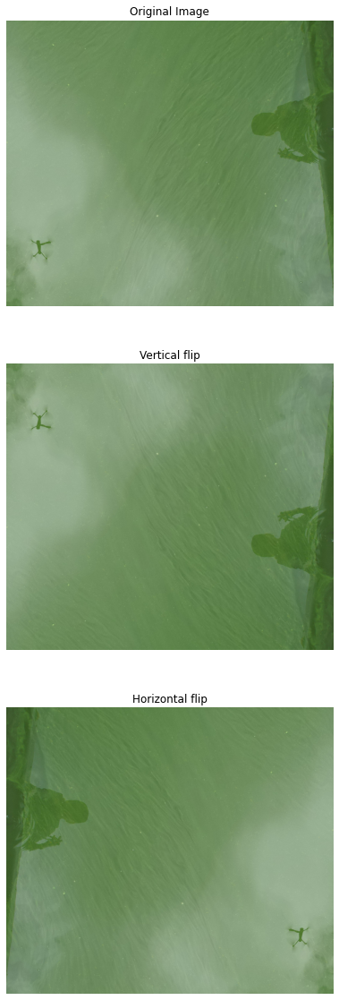

In [85]:
image_path = "C:/afeka/augment.jpg"
image = cv2.imread(image_path)
image = transforms.ToTensor()(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

transformed_image= transforms.RandomVerticalFlip(p=1)(image)
transformed_image = transformed_image.permute(1, 2, 0).numpy()
transformed_image1= transforms.RandomHorizontalFlip(p=1)(image)
transformed_image1 = transformed_image1.permute(1, 2, 0).numpy()
fig, axes = plt.subplots(3, 1, figsize=(15, 20))
image = image.permute(1, 2, 0).numpy()
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")
axes[1].imshow(transformed_image)
axes[1].set_title("Vertical flip")
axes[2].imshow(transformed_image1)
axes[2].set_title("Horizontal flip")

Text(0.5, 1.0, 'Random Crop 2')

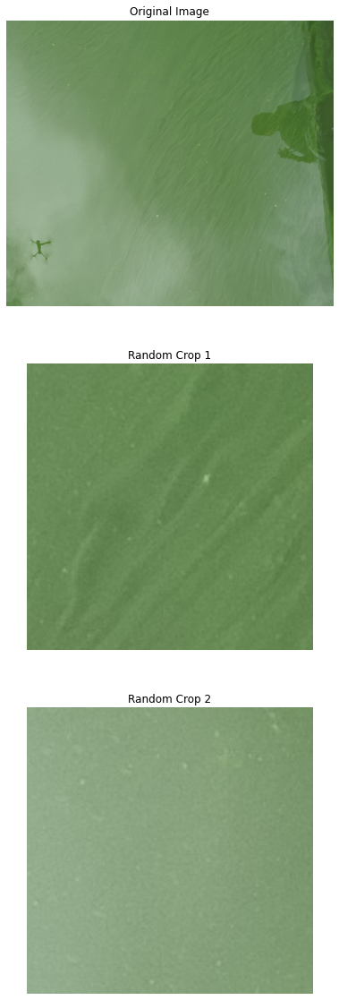

In [56]:
image = cv2.imread( "C:/afeka/augment.jpg")
image = transforms.ToTensor()(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

transformed_image= Random_crop_or_not(p=1)(image)
transformed_image = transformed_image.permute(1, 2, 0).numpy()
transformed_image1= Random_crop_or_not(p=1)(image)
transformed_image1 = transformed_image1.permute(1, 2, 0).numpy()
fig, axes = plt.subplots(3, 1, figsize=(15, 20))
image = image.permute(1, 2, 0).numpy()
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")
axes[1].imshow(transformed_image)
axes[1].set_title("Random Crop 1")
axes[2].imshow(transformed_image1)
axes[2].set_title("Random Crop 2")

Text(0.5, 1.0, 'Sharpen High')

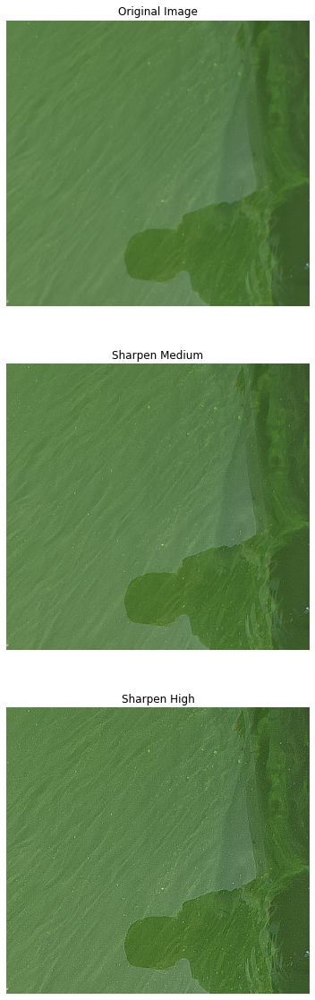

In [54]:
image_path = "C:/afeka/augment2.jpg"
image = cv2.imread(image_path)
image = transforms.ToTensor()(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

transformed_image=  transforms.Lambda(lambda img: transforms.functional.adjust_sharpness(img, 10.0))(image)
transformed_image = transformed_image.permute(1, 2, 0).numpy()
transformed_image1= transforms.Lambda(lambda img: transforms.functional.adjust_sharpness(img, 20.0))(image)
transformed_image1 = transformed_image1.permute(1, 2, 0).numpy()
fig, axes = plt.subplots(3, 1, figsize=(15, 20))
image = image.permute(1, 2, 0).numpy()
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")
axes[1].imshow(transformed_image)
axes[1].set_title("Sharpen Medium")
axes[2].imshow(transformed_image1)
axes[2].set_title("Sharpen High")

Text(0.5, 1.0, 'Adjust Contrast')

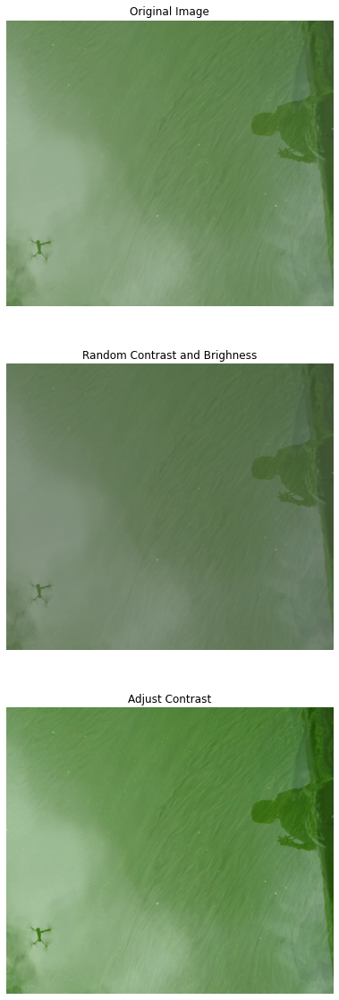

In [64]:
class RandomContrastBrightness(object):
    def __init__(self, contrast_range=(0.20), brightness_range=(0.20)):
        self.contrast_range = contrast_range
        self.brightness_range = brightness_range

    def __call__(self, image):
        transform = transforms.ColorJitter(contrast=self.contrast_range, brightness=self.brightness_range)
        transformed_image = transform(image)
        return transformed_image
# Define the transformations
random_contrast_brightness = RandomContrastBrightness()

image_path = "C:/afeka/augment.jpg"
image = transforms.ToTensor()(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

transformed_image= RandomContrastBrightness()(image)
transformed_image = transformed_image.permute(1, 2, 0).numpy()
transformed_image1= transforms.Lambda(lambda img: transforms.functional.adjust_contrast(img, 1.3))(image)
transformed_image1 = transformed_image1.permute(1, 2, 0).numpy()
fig, axes = plt.subplots(3, 1, figsize=(15, 20))
image = image.permute(1, 2, 0).numpy()
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")
axes[1].imshow(transformed_image)
axes[1].set_title("Random Contrast and Brighness")
axes[2].imshow(transformed_image1)
axes[2].set_title("Adjust Contrast")

Text(0.5, 1.0, 'Random Rotation2')

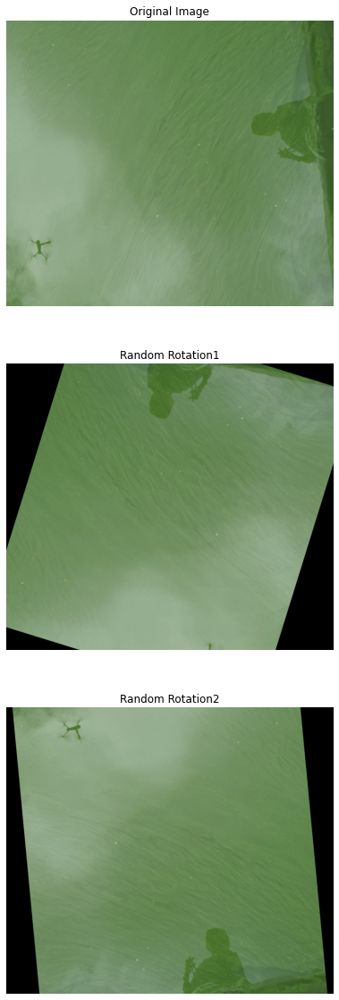

In [66]:

image_path = "C:/afeka/augment.jpg"
image = transforms.ToTensor()(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

transformed_image= transforms.RandomRotation(180)(image)
transformed_image = transformed_image.permute(1, 2, 0).numpy()
transformed_image1= transforms.RandomRotation(180)(image)
transformed_image1 = transformed_image1.permute(1, 2, 0).numpy()
fig, axes = plt.subplots(3, 1, figsize=(15, 20))
image = image.permute(1, 2, 0).numpy()
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")
axes[1].imshow(transformed_image)
axes[1].set_title("Random Rotation1")
axes[2].imshow(transformed_image1)
axes[2].set_title("Random Rotation2")

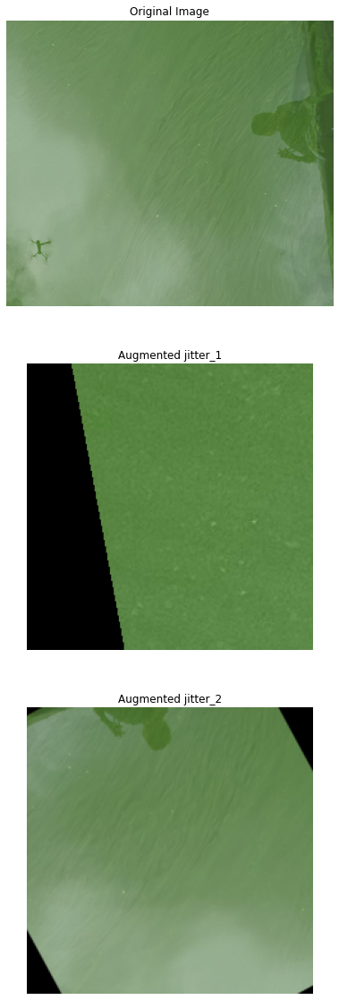

In [80]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import torchvision.transforms as transforms
from PIL import Image

# Define your image path correctly, e.g., "C:/afeka/augment.jpg"
image_path = "C:/afeka/augment.jpg"
image = cv2.imread(image_path)
image = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert to PIL Image

# Define data augmentation transformations
aug_transforms = transforms.Compose([
    RandomTransform_sharpen(),
    RandomTransform_contrast_brightness(),
    Random_flip(),
    transforms.RandomRotation(180),
    Random_crop_or_not(),
    transforms.ToTensor()
])

transformed_image = aug_transforms(image)
transformed_image = transformed_image.permute(1, 2, 0).numpy()
transformed_image1 = aug_transforms(image)
transformed_image1 = transformed_image1.permute(1, 2, 0).numpy()

fig, axes = plt.subplots(3, 1, figsize=(15, 20))
image = np.array(image)  # Convert PIL Image back to a NumPy array
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")
axes[1].imshow(transformed_image)
axes[1].set_title("Augmented jitter_1")
axes[2].imshow(transformed_image1)
axes[2].set_title("Augmented jitter_2")

plt.show()



IndexError: index 3 is out of bounds for axis 0 with size 3

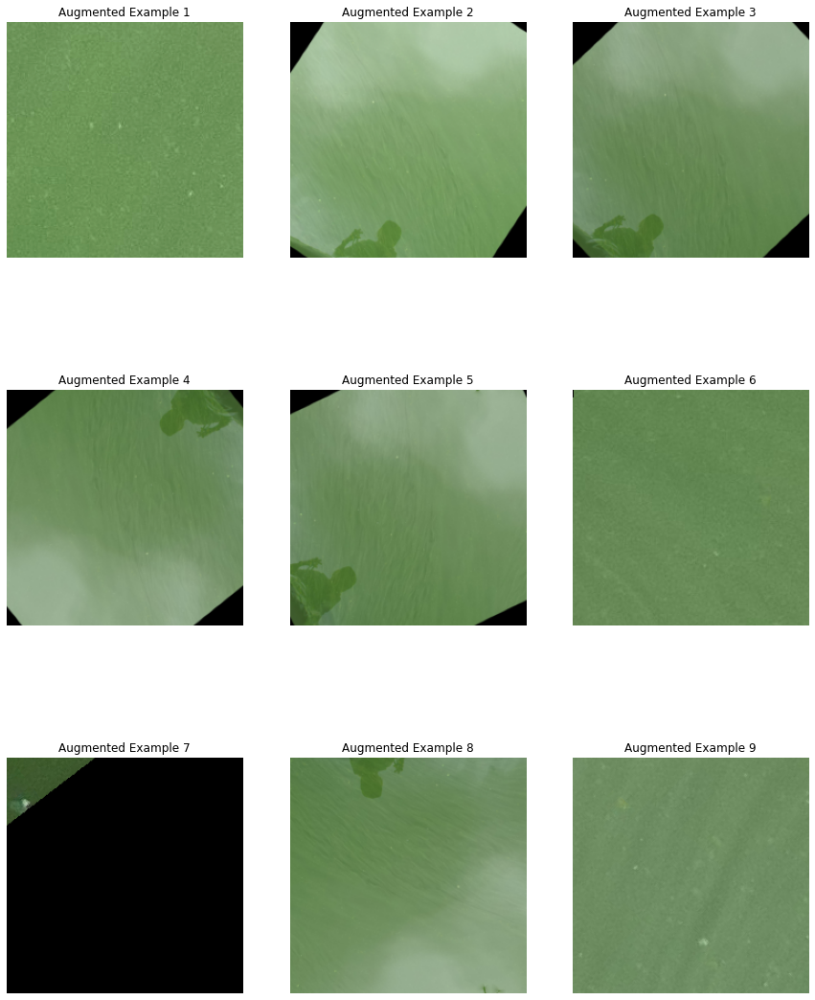

In [98]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import torchvision.transforms as transforms
from PIL import Image

# Define your image path correctly, e.g., "C:/afeka/augment.jpg"
image_path = "C:/afeka/augment.jpg"
image = cv2.imread(image_path)

# Define data augmentation transformations
aug_transforms = transforms.Compose([
    RandomTransform_sharpen(),
    RandomTransform_contrast_brightness(),
    Random_flip(),
    transforms.RandomRotation(180),
    Random_crop_or_not(),
    transforms.ToTensor()
])

fig, axes = plt.subplots(3, 3, figsize=(15, 20))

for i in range(13):
    if i == 0:
        continue  # Skip the original image
    image_pil = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert to PIL Image
    transformed_image = aug_transforms(image_pil)
    transformed_image = transformed_image.permute(1, 2, 0).numpy()

    row = (i - 1) // 3
    col = (i - 1) % 3
    axes[row, col].axis("off")
    axes[row, col].imshow(transformed_image)
    axes[row, col].set_title(f"Augmented Example {i}")

plt.show()


Text(0.5, 1.0, 'Augmented jitter_2')

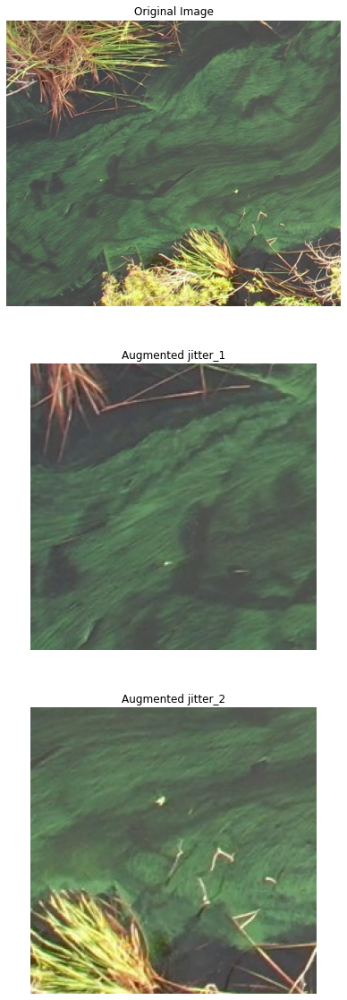

In [466]:
image = cv2.imread( r"C:\Users\urial\BG\AlphaBravo\work\frame_1.jpg")
image = transforms.ToTensor()(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

transformed_image= Random_crop_or_not(p=1)(image)
transformed_image = transformed_image.permute(1, 2, 0).numpy()
transformed_image1= Random_crop_or_not(p=1)(image)
transformed_image1 = transformed_image1.permute(1, 2, 0).numpy()
fig, axes = plt.subplots(3, 1, figsize=(15, 20))
image = image.permute(1, 2, 0).numpy()
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")
axes[1].imshow(transformed_image)
axes[1].set_title("Augmented jitter_1")
axes[2].imshow(transformed_image1)
axes[2].set_title("Augmented jitter_2")


Text(0.5, 1.0, 'Augmented jitter_2')

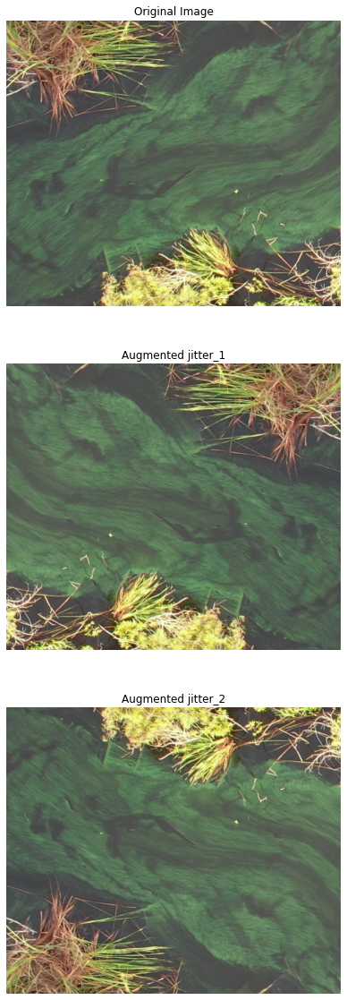

In [467]:
image = cv2.imread( r"C:\Users\urial\BG\AlphaBravo\work\frame_1.jpg")
image = transforms.ToTensor()(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

transformed_image= Random_flip(p=1)(image)
transformed_image = transformed_image.permute(1, 2, 0).numpy()
transformed_image1= Random_flip(p=1)(image)
transformed_image1 = transformed_image1.permute(1, 2, 0).numpy()
fig, axes = plt.subplots(3, 1, figsize=(15, 20))
image = image.permute(1, 2, 0).numpy()
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")
axes[1].imshow(transformed_image)
axes[1].set_title("Augmented jitter_1")
axes[2].imshow(transformed_image1)
axes[2].set_title("Augmented jitter_2")

Text(0.5, 1.0, 'Augmented jitter_2')

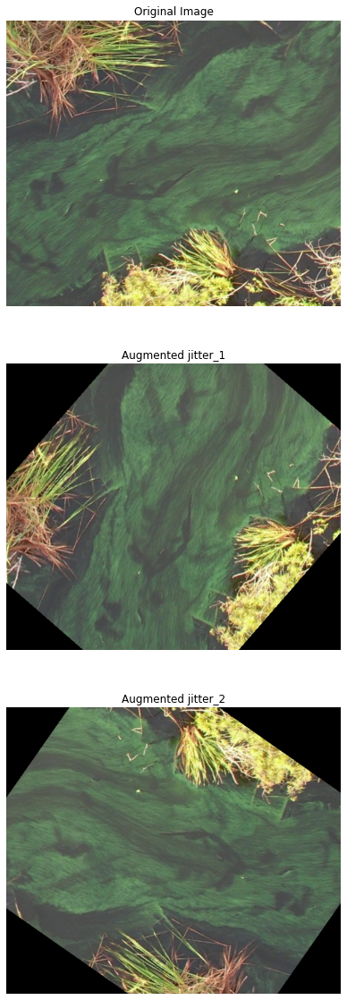

In [471]:

image = cv2.imread( r"C:\Users\urial\BG\AlphaBravo\work\frame_1.jpg")
image = transforms.ToTensor()(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

transformed_image= transforms.RandomRotation(180)(image)
transformed_image = transformed_image.permute(1, 2, 0).numpy()
transformed_image1= transforms.RandomRotation(180)(image)
transformed_image1 = transformed_image1.permute(1, 2, 0).numpy()
fig, axes = plt.subplots(3, 1, figsize=(15, 20))
image = image.permute(1, 2, 0).numpy()
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")
axes[1].imshow(transformed_image)
axes[1].set_title("Augmented jitter_1")
axes[2].imshow(transformed_image1)
axes[2].set_title("Augmented jitter_2")

Text(0.5, 1.0, 'Augmented jitter_1')

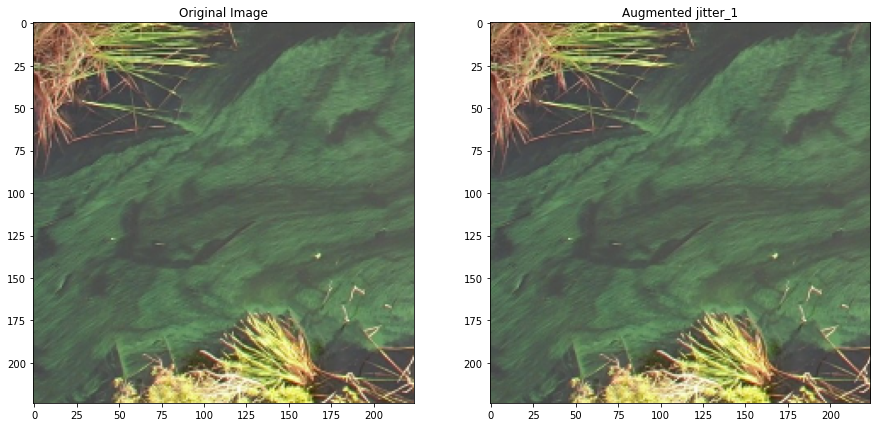

In [452]:
image = cv2.imread( r"C:\Users\urial\BG\AlphaBravo\work\frame_1.jpg")
image = transforms.ToTensor()(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
transformed_image= Random_crop_or_not()(image)
transformed_image = transformed_image.permute(1, 2, 0).numpy()
transformed_image1= Random_crop_or_not()(image)
transformed_image1 = transformed_image1.permute(1, 2, 0).numpy()
fig, axes = plt.subplots(1, 2, figsize=(15, 20))
axes[0].imshow(transformed_image)#cv2.cvtColor(transformed_image, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
# axes[0].axis("off")
axes[1].imshow(transformed_image)#cv2.cvtColor(transformed_image1, cv2.COLOR_BGR2RGB))
axes[1].set_title("Augmented jitter_1")

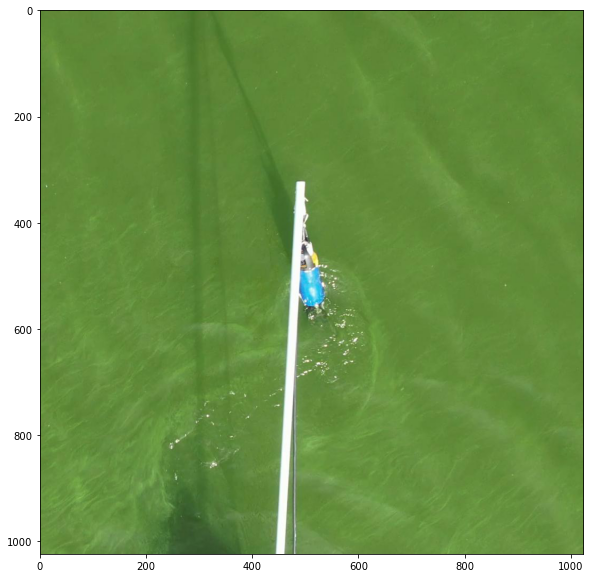

In [441]:
plt.figure(figsize=(10,10))
plt.imshow(transformed_image)


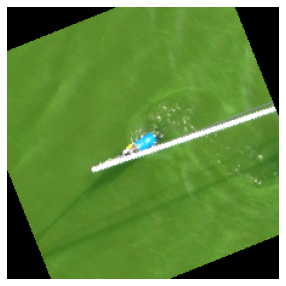

In [160]:
import torch
import torchvision.transforms as transforms
import random

# # Define the desired crop size and center offset
# crop_size = 0.5  # Half the image size
center_offset_range = (-0.25, 0.25)  # Adjust the range as desired
sharpness_factor = 2.0 
contrast_factor = 1.2 
# Randomly select a center offset
center_offset = random.uniform(*center_offset_range)

# Create the transformation pipeline
transform = transforms.Compose([
    transforms.ToPILImage(),
#     transforms.CenterCrop(crop_size),
#     transforms.RandomCrop(crop_size),
#     
#     
    transforms.ToTensor()
])
preprocess = transforms.Compose([transforms.ToPILImage(),
                                 Random_crop_or_not(),
                                 RandomTransform_sharpen(),
                                 RandomTransform_contrast_brightness(),
                                 Random_flip(),
                                 transforms.RandomRotation(180),#RandomTransform(p=0.5),
        transforms.ToTensor()])

im_2 = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\final\4443_1638784768.jpg'
im1 = r"C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\8614_1637053581.jpg"
image = transforms.ToTensor()(cv2.cvtColor(cv2.imread(im_2), cv2.COLOR_BGR2RGB))
crop_size= image.shape[2]/2
augmented_image = preprocess(image)

# Display the augmented image
transformed_image = augmented_image.permute(1, 2, 0).numpy()
plt.figure(figsize=(5,5))
plt.imshow(transformed_image)
plt.axis('off')
plt.show()


In [300]:
image = transforms.ToTensor()(cv2.cvtColor(cv2.imread(r"C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\8614_1637053581.jpg"), cv2.COLOR_BGR2RGB))



1024

In [ ]:
import torch
import cv2
import numpy as np
import random

class RandomWaterAugmentation:
    def __init__(self):
        self.transforms = [
            color_jitter,
            random_contrast_brightness,
            random_rotation,
            random_crop,
            horizontal_flip,
            gaussian_blur,
            random_noise
        ]
    
    def __call__(self, image):
        transform = random.choice(self.transforms)
        augmented_image = transform(image)
        return augmented_image

# Example usage
augmentation = RandomWaterAugmentation()
image = cv2.imread('your_image_path.jpg')  # Load your image here

# Convert image to PyTorch tensor
image_tensor = torch.from_numpy(image.transpose(2, 0, 1)).float() / 255.0

# Apply augmentation
augmented_image = augmentation(image_tensor)

# Convert augmented image back to NumPy array
augmented_image = (augmented_image * 255.0).byte().numpy().transpose(1, 2, 0)


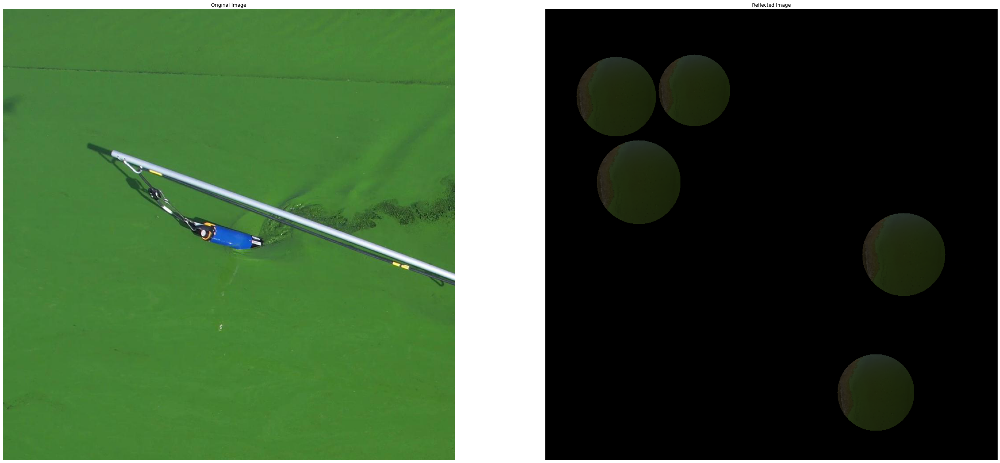

In [867]:
import cv2
import numpy as np

import matplotlib.pyplot as plt
import random
def apply_cloud_reflection(image, cloud_images, num_clouds=5, alpha=0.3):
    h, w = image.shape[:2]
    result = np.copy(image)

    for _ in range(num_clouds):
        cloud_image = random.choice(cloud_images)
        cloud_h, cloud_w = cloud_image.shape[:2]

        # Resize the cloud image to make it larger
        scale_factor = np.random.uniform(1.5, 2.0)
        cloud_image = cv2.resize(cloud_image, (int(cloud_w * scale_factor), int(cloud_h * scale_factor)))

        cloud_h, cloud_w = cloud_image.shape[:2]
        x, y = np.random.randint(0, w - cloud_w), np.random.randint(0, h - cloud_h)

        # Generate a circular mask to paste the cloud image onto
        mask = create_circular_mask(cloud_h, cloud_w)
        mask = cv2.resize(mask, (cloud_w, cloud_h))

        # Blend the cloud image with the input image using the mask and provided alpha
        for c in range(3):
            result[y:y+cloud_h, x:x+cloud_w, c] = result[y:y+cloud_h, x:x+cloud_w, c] * (1 - alpha * mask) + cloud_image[:, :, c] * alpha * mask

    # Clip values to the valid range
    result = np.clip(result, 0, 255).astype(np.uint8)
    return result

# Helper function to create a circular mask
def create_circular_mask(h, w):
    y, x = np.ogrid[:h, :w]
    center_x, center_y = w // 2, h // 2
    mask = (x - center_x) ** 2 + (y - center_y) ** 2 <= (w // 2) ** 2
    return mask.astype(np.uint8)

# Helper function to create alpha channel
def create_alpha_channel(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, alpha = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)
    b, g, r = cv2.split(image)
    rgba = [b, g, r, alpha]
    return cv2.merge(rgba, 4)

# Load cloud reflection images
def load_cloud_images(path1,path2):
    cloud_image1 = cv2.imread(path1)
    cloud_image2 = cv2.imread(path2)

    # Resize the cloud images to a fixed size (e.g., 100x100)
    cloud_image1 = cv2.resize(cloud_image1, (100, 100))
    cloud_image2 = cv2.resize(cloud_image2, (100, 100))

    return [cloud_image1, cloud_image2]
path1 = r"C:\Users\urial\BG\inferences\app\IMG-20210716-WA0014.jpg"
path2 = r"C:\Users\urial\BG\inferences\app\IMG-20210716-WA0014.jpg"
cloud_images = load_cloud_images(path1,path2)#[cloud_image1, cloud_image2]

# Example usage:
input_image = cv2.imread(r"C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\8614_1637053581.jpg")
reflected_image = apply_cloud_reflection(input_image / 255.0, cloud_images, num_clouds=5, alpha=0.3)

fig, axes = plt.subplots(1, 2, figsize=(45, 45))
axes[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor(reflected_image, cv2.COLOR_BGR2RGB))
axes[1].set_title("Reflected Image")
axes[1].axis("off")

plt.show()








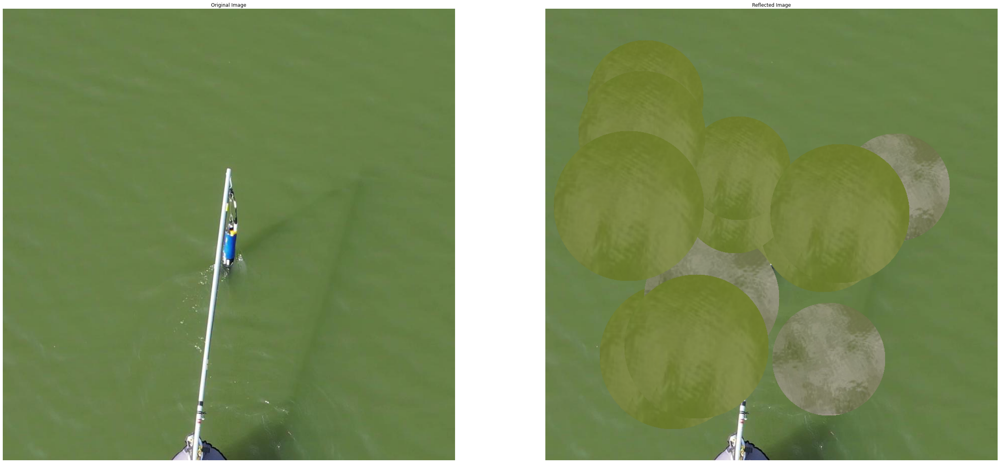

In [921]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

def apply_cloud_reflection(image, cloud_images, num_clouds=5, alpha=0.3):
    h, w = image.shape[:2]
    result = np.copy(image)

    for _ in range(num_clouds):
        cloud_image = random.choice(cloud_images)
        cloud_h, cloud_w = cloud_image.shape[:2]

        # Resize the cloud image to make it bigger
        scale_factor = np.random.uniform(2.0, 3.0)
        cloud_image = cv2.resize(cloud_image, (int(cloud_w * scale_factor), int(cloud_h * scale_factor)))

        cloud_h, cloud_w = cloud_image.shape[:2]
        x, y = np.random.randint(0, w - cloud_w), np.random.randint(0, h - cloud_h)

        # Generate a circular mask to paste the cloud image onto
        mask = create_circular_mask(cloud_h, cloud_w)
        mask = cv2.resize(mask, (cloud_w, cloud_h))

        # Blend the cloud image with the input image using the mask and provided alpha
        for c in range(3):
            result[y:y+cloud_h, x:x+cloud_w, c] = result[y:y+cloud_h, x:x+cloud_w, c] * (1 - alpha * mask) + cloud_image[:, :, c] * alpha * mask

    # Clip values to the valid range
    result = np.clip(result, 0, 255).astype(np.uint8)
    return result

# Helper function to create a circular mask
def create_circular_mask(h, w):
    y, x = np.ogrid[:h, :w]
    center_x, center_y = w // 2, h // 2
    mask = (x - center_x) ** 2 + (y - center_y) ** 2 <= (w // 2) ** 2
    return mask.astype(np.uint8)

# Helper function to create alpha channel
def create_alpha_channel(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, alpha = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)
    b, g, r = cv2.split(image)
    rgba = [b, g, r, alpha]
    return cv2.merge(rgba, 4)

# Load cloud reflection images
def load_cloud_images(path1, path2):
    cloud_image1 = cv2.imread(path1)
    cloud_image2 = cv2.imread(path2)

    if cloud_image1 is None:
        raise ValueError(f"Failed to load image from path: {path1}")

    if cloud_image2 is None:
        raise ValueError(f"Failed to load image from path: {path2}")

    # Resize the cloud images to a fixed size (e.g., 100x100)
    cloud_image1 = cv2.resize(cloud_image1, (100, 100))
    cloud_image2 = cv2.resize(cloud_image2, (100, 100))

    return [cloud_image1, cloud_image2]


path1 = r"C:\Users\urial\BG\AlphaBravo\samples\clouds\clouds4.jpg"
path2 = r"C:\Users\urial\BG\AlphaBravo\samples\clouds\clouds2.jpg"
cloud_images = load_cloud_images(path1, path2)

# Example usage:
input_image = cv2.imread(r"C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\final\23_1637052319.jpg")

# Apply cloud reflection
reflected_image = apply_cloud_reflection(input_image, cloud_images, num_clouds=15, alpha=1)

# Display the images
fig, axes = plt.subplots(1, 2, figsize=(45, 45))
axes[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor(reflected_image, cv2.COLOR_BGR2RGB))
axes[1].set_title("Reflected Image")
axes[1].axis("off")

plt.show()


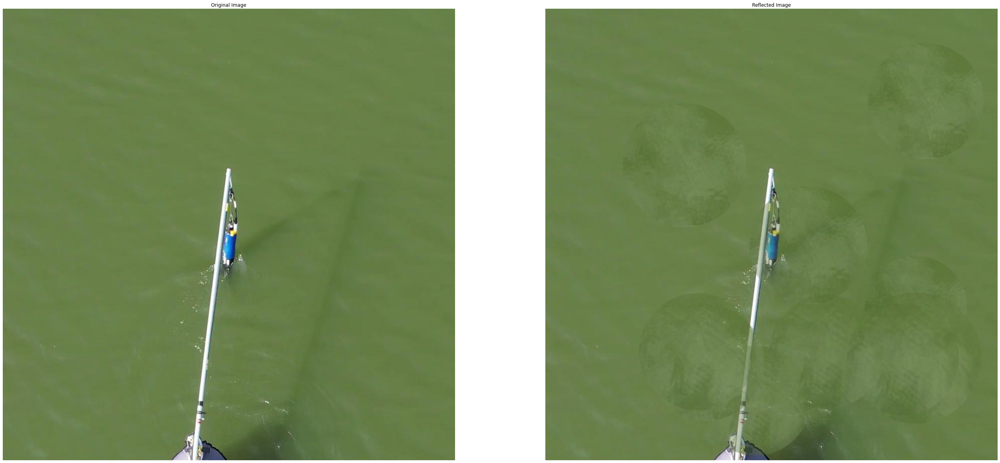

In [924]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

def apply_cloud_reflection(image, cloud_images, num_clouds=5, alpha=0.3):
    h, w = image.shape[:2]
    result = np.copy(image)

    # Calculate mean and standard deviation of the input image
    input_means = np.mean(image, axis=(0, 1))
    input_stds = np.std(image, axis=(0, 1))

    for _ in range(num_clouds):
        cloud_image = random.choice(cloud_images)
        cloud_h, cloud_w = cloud_image.shape[:2]

        # Resize the cloud image to make it bigger
        scale_factor = np.random.uniform(2.0, 3.0)
        cloud_image = cv2.resize(cloud_image, (int(cloud_w * scale_factor), int(cloud_h * scale_factor)))

        cloud_h, cloud_w = cloud_image.shape[:2]
        x, y = np.random.randint(0, w - cloud_w), np.random.randint(0, h - cloud_h)

        # Adjust the color attributes of the cloud image to match the input image
        for c in range(3):
            cloud_mean = np.mean(cloud_image[:, :, c])
            cloud_std = np.std(cloud_image[:, :, c])
            cloud_image[:, :, c] = ((cloud_image[:, :, c] - cloud_mean) * (input_stds[c] / cloud_std)) + input_means[c]

        # Generate a circular mask to paste the cloud image onto
        mask = create_circular_mask(cloud_h, cloud_w)
        mask = cv2.resize(mask, (cloud_w, cloud_h))

        # Blend the cloud image with the input image using the mask and provided alpha
        for c in range(3):
            result[y:y+cloud_h, x:x+cloud_w, c] = result[y:y+cloud_h, x:x+cloud_w, c] * (1 - alpha * mask) + cloud_image[:, :, c] * alpha * mask

    # Clip values to the valid range
    result = np.clip(result, 0, 255).astype(np.uint8)
    return result


# Rest of the code remains the same...

# Helper function to create a circular mask
def create_circular_mask(h, w):
    y, x = np.ogrid[:h, :w]
    center_x, center_y = w // 2, h // 2
    mask = (x - center_x) ** 2 + (y - center_y) ** 2 <= (w // 2) ** 2
    return mask.astype(np.uint8)

# Helper function to create alpha channel
def create_alpha_channel(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, alpha = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)
    b, g, r = cv2.split(image)
    rgba = [b, g, r, alpha]
    return cv2.merge(rgba, 4)

# Load cloud reflection images
def load_cloud_images(path1, path2):
    cloud_image1 = cv2.imread(path1)
    cloud_image2 = cv2.imread(path2)

    if cloud_image1 is None:
        raise ValueError(f"Failed to load image from path: {path1}")

    if cloud_image2 is None:
        raise ValueError(f"Failed to load image from path: {path2}")

    # Resize the cloud images to a fixed size (e.g., 100x100)
    cloud_image1 = cv2.resize(cloud_image1, (100, 100))
    cloud_image2 = cv2.resize(cloud_image2, (100, 100))

    return [cloud_image1, cloud_image2]


path1 = r"C:\Users\urial\BG\AlphaBravo\samples\clouds\clouds4.jpg"
path2 = r"C:\Users\urial\BG\AlphaBravo\samples\clouds\clouds2.jpg"
cloud_images = load_cloud_images(path1, path2)

# Example usage:
input_image = cv2.imread(r"C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\final\23_1637052319.jpg")

# Apply cloud reflection
reflected_image = apply_cloud_reflection(input_image, cloud_images, num_clouds=10, alpha=0.4)

# Display the images
fig, axes = plt.subplots(1, 2, figsize=(45, 45))
axes[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor(reflected_image, cv2.COLOR_BGR2RGB))
axes[1].set_title("Reflected Image")
axes[1].axis("off")

plt.show()

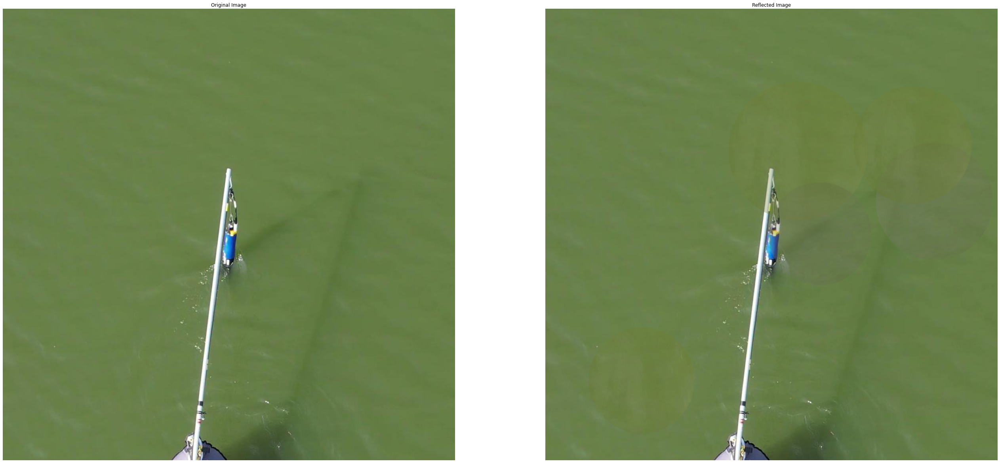

In [897]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random


def apply_cloud_reflection(image, cloud_images, num_clouds=5, alpha=0.3):
    h, w = image.shape[:2]
    result = np.copy(image)

    for _ in range(num_clouds):
        cloud_image = random.choice(cloud_images)
        cloud_h, cloud_w = cloud_image.shape[:2]

        # Resize the cloud image to make it bigger
        scale_factor = np.random.uniform(2.0, 3.0)
        cloud_image = cv2.resize(cloud_image, (int(cloud_w * scale_factor), int(cloud_h * scale_factor)))

        cloud_h, cloud_w = cloud_image.shape[:2]
        x, y = np.random.randint(0, w - cloud_w), np.random.randint(0, h - cloud_h)

        # Generate an elliptical mask to paste the cloud image onto
        mask = create_elliptical_mask(cloud_h, cloud_w)
        mask = cv2.resize(mask, (cloud_w, cloud_h), interpolation=cv2.INTER_NEAREST)  # Use INTER_NEAREST

        # Blend the cloud image with the input image using the mask and provided alpha
        for c in range(3):
            result[y:y+cloud_h, x:x+cloud_w, c] = result[y:y+cloud_h, x:x+cloud_w, c] * (1 - alpha * mask) + cloud_image[:, :, c] * alpha * mask

    # Clip values to the valid range
    result = np.clip(result, 0, 255).astype(np.uint8)
    return result

# Helper function to create an elliptical mask
def create_elliptical_mask(h, w):
    y, x = np.ogrid[:h, :w]
    center_x, center_y = w // 2, h // 2
    a = w // 2  # Semi-major axis length (horizontal axis)
    b = h // 2  # Semi-minor axis length (vertical axis)
    mask = (x - center_x) ** 2 / a ** 2 + (y - center_y) ** 2 / b ** 2 <= 1
    return mask.astype(np.uint8)

# ... (rest of the code remains the same)

# Apply cloud reflection
reflected_image = apply_cloud_reflection(input_image, cloud_images, num_clouds=5, alpha=0.3)

# Display the images
fig, axes = plt.subplots(1, 2, figsize=(45, 45))
axes[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor(reflected_image, cv2.COLOR_BGR2RGB))
axes[1].set_title("Reflected Image")
axes[1].axis("off")

plt.show()



In [7]:
from PIL import Image
import os

def generate_crops(image_path, crop_size, stride_x, stride_y,output_dir):
    # Open the input image
    input_image = Image.open(image_path)
    width, height = input_image.size


    os.makedirs(output_dir, exist_ok=True)

    # Loop over the image in a grid-like form
    for x in range(0, width - crop_size + 1, stride_x):
        for y in range(0, height - crop_size + 1, stride_y):
            # Calculate the coordinates for the crop
            left = x
            upper = y
            right = x + crop_size
            lower = y + crop_size

            # Check if the crop is within the image boundaries
            if right <= width and lower <= height:
                # Crop the image
                crop = input_image.crop((left, upper, right, lower))

                # Save the cropped image
                output_path = os.path.join(output_dir, f"crop_x{x}_y{y}.png")
                crop.save(output_path)

# Example usage:
    # Ensure the output directory exists
output_dir_ = r"C:\Users\urial\BG\AlphaBravo\samples\eperiments"
for i in ['512','756','1012']:
    output_dir = os.path.join(output_dir_,i)
    image_path = r"C:\Users\urial\BG\AlphaBravo\samples\samples_combined1\inf\4904_1637053910.jpg"
    crop_size = int(i)
    stride_x = int(crop_size/2)
    stride_y = int(crop_size/2)

    generate_crops(image_path, crop_size, stride_x, stride_y,output_dir)


In [8]:
import cv2

def extract_frame(video_path, frame_number, output_path):
    # Open the video file
    cap = cv2.VideoCapture(video_path)
    
    # Check if the video file was opened successfully
    if not cap.isOpened():
        print("Error: Could not open video file.")
        return
    
    # Get the total number of frames in the video
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Check if the provided frame number is within valid range
    if frame_number < 0 or frame_number >= total_frames:
        print("Error: Invalid frame number.")
        return
    
    # Set the frame position to the desired frame number
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_number)
    
    # Read the frame
    ret, frame = cap.read()
    
    # Check if the frame was read successfully
    if not ret:
        print("Error: Could not read frame.")
        return
    
    # Save the frame as an image
    cv2.imwrite(output_path, frame)
    
    # Release the video capture object
    cap.release()
    
    print(f"Frame {frame_number} extracted and saved as {output_path}")



In [22]:
# Set your input drone video path
input_video_path = r'C:\Users\urial\Downloads\DJI_0030.MP4'

# Set the desired frame number to extract
desired_frame_number = 3500  # Change this to the frame number you want to extract

# Set the output image path
output_image_path = r'C:\Users\urial\Downloads\A_och\frame_12.jpg'

# Call the function to extract and save the desired frame as an image
extract_frame(input_video_path, desired_frame_number, output_image_path)


Frame 3500 extracted and saved as C:\Users\urial\Downloads\A_och\frame_12.jpg


In [24]:
import pandas as pd
# Read the text file into a DataFrame
txt_file_path = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\final\test_index_cat.txt'
txt_df = pd.read_csv(txt_file_path, sep='\s+', header=None, names=['ImagePath', 'Category'])



0      4941_1637052774.jpg
1      7679_1638783632.jpg
2      2640_1637053382.jpg
3      3278_1637053009.jpg
4      1094_1637052645.jpg
              ...         
553    1104_1638783995.jpg
554    7941_1637053559.jpg
555    5005_1638783834.jpg
556    1157_1638783997.jpg
557    2471_1637051732.jpg
Name: ImageName, Length: 558, dtype: object


# fixing the data

## fix only 5-6

In [334]:
def clean_img(file_path,out_dir,min_cat = 0):
    with open(file_path,'r') as f:
        for line in f:
            line = line.strip().split()
            image_path = line[0]  # Image path is the first column
            category = line[1]  # Category is the second column
            if int(category)>=min_cat:
                i = CleanImage(image_path,int(category),experiment=False)
                i.save_result(out_dir)
            else:
                print('no change')
                file_name = image_path.split('\\')[-1]
                output_file = os.path.join(out_dir,file_name)
                print(output_file)
                # Copy the image to the destination folder
                shutil.copy(image_path, output_file)

In [340]:
file_path = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\test_index_cat.txt'
out_dir = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5'
clean_img(file_path,out_dir,6)

Biggest rec:
center:(454, 454),width:82,height:36,angle:80
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\4128_1638783805.jpg
Biggest rec:
center:(820, 511),width:29,height:14,angle:24
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\8282_1637053570.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\6125_1637052522.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\7023_1638783319.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\2870_1637053390.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\55

Biggest rec:
center:(386, 387),width:24,height:23,angle:48
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\1157_1638783997.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\4184_1638784759.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\2446_1638777444.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\1030_1637053910.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\5710_1637054066.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3266_1638259629.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\sam

417
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\4130_1637053723.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\717_1637052342.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\360_1637052912.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3053_1637051460.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3868_1638783505.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\8628_1637051646.jpg
Biggest rec:
center:(994, 451),width:32,height:17,angle:90
50
image saved at:
C:\Users\urial\BG\AlphaBravo\sam

Biggest rec:
center:(511, 468),width:18,height:53,angle:70
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\7883_1637053557.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\2642_1637053673.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\4678_1637052474.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\6377_1638777575.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\4379_1638259957.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3853_1637051778.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\sam

Biggest rec:
center:(365, 365),width:19,height:21,angle:90
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\1694_1638784015.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\6463_1637051574.jpg
Biggest rec:
center:(510, 526),width:24,height:10,angle:74
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\8361_1638783655.jpg
Biggest rec:
center:(315, 315),width:19,height:61,angle:90
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3311_1638784068.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\7906_1637053849.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\

image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\1282_1638784001.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\4161_1637053433.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\972_1638777395.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3286_1637051759.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\516_1638783393.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\366_1637053306.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\t

Biggest rec:
center:(305, 394),width:6,height:17,angle:0
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\7761_1638783926.jpg
Biggest rec:
center:(465, 489),width:95,height:52,angle:80
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3127_1638783771.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\5201_1637053758.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3137_1637051463.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\7936_1637054141.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3703

image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\6988_1637052842.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\6340_1637052529.jpg
Biggest rec:
center:(506, 511),width:34,height:60,angle:0
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\6489_1638777870.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\931_1637054198.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\2490_1638784703.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\2115_1637052388.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples

Biggest rec:
center:(278, 345),width:4,height:79,angle:0
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\1318_1638783711.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\5287_1638784134.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3375_1638785023.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\1771_1637052668.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3799_1638259938.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3656_1638785033.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\sampl

Biggest rec:
center:(511, 525),width:24,height:12,angle:90
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\4554_1638783819.jpg
Biggest rec:
center:(24, 446),width:18,height:86,angle:39
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\8384_1637052888.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\5293_1638783262.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\1307_1637052362.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\3133_1637053398.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\246

Biggest rec:
center:(511, 511),width:35,height:23,angle:19
50


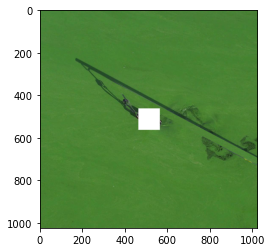

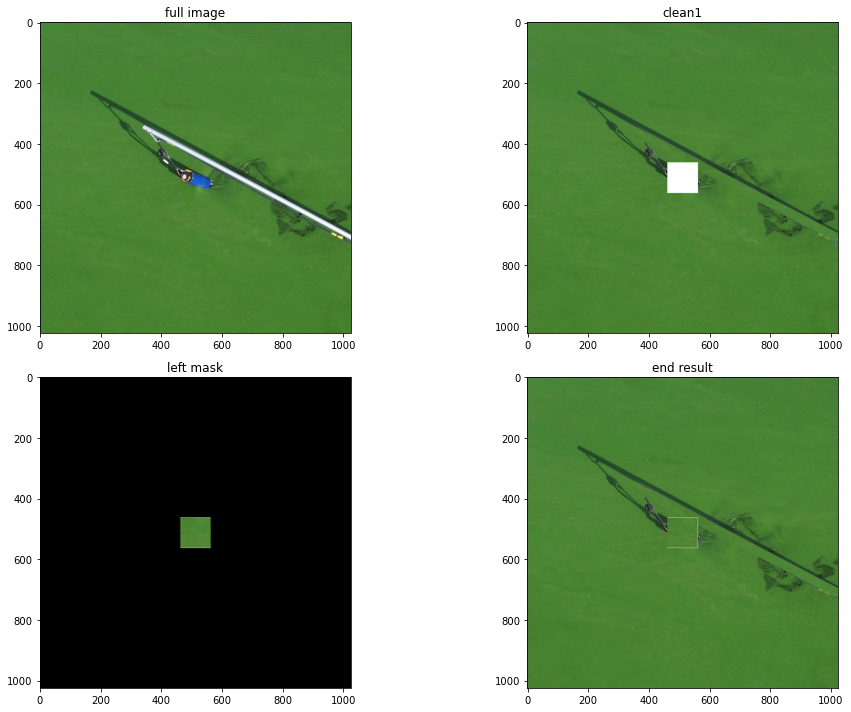

In [356]:
path= r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\7358_1637053539.jpg'
i = CleanImage(path,5)
i.plot_steps()

In [354]:
i.save_result(r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5')

image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\7432_1638783624.jpg


In [344]:
file_path = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\validation_index_cat.txt'
out_dir = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5'
clean_img(file_path,out_dir,6)

Biggest rec:
center:(415, 811),width:105,height:40,angle:90
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\611_1638783978.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\1571_1637053346.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\6451_1637053509.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\1655_1637052373.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\4707_1637052475.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\2_1637052900.jpg
no change
C:\User

Biggest rec:
center:(511, 511),width:28,height:28,angle:45
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\1106_1637053622.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\4465_1638259960.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\1003_1637052351.jpg
Biggest rec:
center:(361, 361),width:17,height:31,angle:65
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\3164_1638784064.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\7271_1637052270.jpg
Biggest rec:
center:(512, 515),width:46,height:95,angle:74
95
entered width<height [459 552 564 471

417
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\419_1638783681.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\1723_1637053642.jpg
Biggest rec:
center:(298, 305),width:5,height:121,angle:90
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\7620_1638783630.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\8504_1638259804.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\5484_1638783559.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\5767_1638785103.jpg
no ch

Biggest rec:
center:(278, 279),width:17,height:29,angle:90
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\4074_1638784094.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\50_1638777655.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\4196_1637051789.jpg
Biggest rec:
center:(304, 305),width:30,height:20,angle:58
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\8233_1638783651.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\271_1637052036.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_

Biggest rec:
center:(365, 390),width:13,height:5,angle:68
50
image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\1659_1638784013.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\3316_1637053405.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\1611_1637052372.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\2906_1637053973.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\43_1638784621.jpg
no change
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5\8248_1637052593.jpg
no change
C:\User

## reduce augmentations


In [332]:
# output_folder = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp\validation\aug'
def augment(input_folder,full = False):
    # Input and output folders
    tran = RandomTransform_contrast_brightness()
    pi =  transforms.ToPILImage()
    # Iterate over image files
    for filename in os.listdir(input_folder):
        if filename.endswith('.jpg') or filename.endswith('.png'):
            # Load image
            input_path = os.path.join(input_folder, filename)
            image = cv2.imread(input_path)

            # Apply augmentation
            augmented_image = apply_augmentation(image.copy())
    #         augmented_image= np.asarray(augmented_image)
            if full:
                augmented_image= pi(augmented_image)
                augmented_image_2 = tran(augmented_image.copy())
                # Convert back to NumPy array
                augmented_image = np.asarray(augmented_image_2)
                
            # Create a folder for the category if it doesn't exist
            category_folder = os.path.join(input_folder, 'aug')
            if not os.path.exists(category_folder):
                os.makedirs(category_folder)

            # Save augmented image
            output_path = os.path.join(category_folder, filename)
            cv2.imwrite(output_path, augmented_image)

    print("Augmentation and saving completed.")


In [357]:
input_folder_t = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5'
input_folder_v = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation\above_5'
augment(input_folder_t)
augment(input_folder_v)

Augmentation and saving completed.
Augmentation and saving completed.


## update index file just for augmentations

In [331]:

def update_index_file(input_file,output_dir):
    with open(input_file, 'r') as f:
        lines = f.readlines()

    new_lines = []
    for line in lines:
        path, label = line.strip().split()
        new_path = os.path.join(output_dir,os.path.basename(path))
        new_line = f'{new_path} {label}\n'
        new_lines.append(new_line)
        
    file_name = input_file.split('\\')[-1]
    output_file = os.path.join(output_dir,file_name)
    with open(output_file, 'w') as f:
        f.writelines(new_lines)

    print("File paths updated and saved.")

In [358]:
input_file = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test_index_cat.txt'
output_dir = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2'
update_index_file(input_file,output_dir)

File paths updated and saved.


In [361]:
input_file = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\train_index_cat.txt'
output_dir = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2'
update_index_file(input_file,output_dir)

File paths updated and saved.


In [343]:
i.save_result(r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5')

image saved at:
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test\above_5\4384_1638784104.jpg


In [368]:
flist = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation_index_cat.txt'
# with open(flist, 'r') as rf:
#        for line in rf.readlines():
#             impath, imlabel = line.strip().split()[0],torch.tensor(int(line.strip().split()[1].split('_')[0]))
#             print(impath, imlabel)
with open(flist, 'r') as rf:
    for line in rf.readlines():
        line_parts = line.strip().split()
        if len(line_parts) >= 2:
            impath, imlabel = line_parts[0], torch.tensor(int(line_parts[1].split('_')[0]))
            print(impath, imlabel)
        else:
            print(f"Error: Line format incorrect - {line}")

C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\611_1638783978.jpg tensor(8)
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\1571_1637053346.jpg tensor(4)
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\6451_1637053509.jpg tensor(5)
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\1655_1637052373.jpg tensor(1)
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\4707_1637052475.jpg tensor(2)
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\2_1637052900.jpg tensor(4)
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\2044_1637051717.jpg tensor(2)
C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_sam

## move to train test

In [265]:
import os
import shutil


def move_samples_by_category(input_file,output_folder,category_dirs = False):
    # Read the input file
    with open(input_file, 'r') as f:
        lines = f.readlines()

    # Iterate over lines and copy images to appropriate folders
    for line in lines:
        line = line.strip()  # Remove leading/trailing whitespace
        if line:
            path, category = line.split()  # Assuming the path and category are separated by a space
            category = int(category)
            category_folder = output_folder
            if category_dirs:
                # Create a folder for the category if it doesn't exist
                category_folder = os.path.join(output_folder, str(category))
                if not os.path.exists(category_folder):
                    os.makedirs(category_folder)

            # Extract the filename from the path
            filename = os.path.basename(path)

            # Construct the destination path
            dest_path = os.path.join(category_folder, filename)

            # Copy the image to the destination folder
            shutil.copy(path, dest_path)

    print("Image copying completed.")


In [266]:
# Input file path
input_file_t = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\test_index_cat.txt'
# Output folder path
output_folder_t = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\test'
# Input file path
input_file_v = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\validation_index_cat.txt'
# Output folder path
output_folder_v = r'C:\Users\urial\BG\AlphaBravo\samples\samples_fixed\fixed\final_samples\data_split\train_val_change\exp2\validation'
move_samples_by_category(input_file_t,output_folder_t)
move_samples_by_category(input_file_v,output_folder_v)

Image copying completed.
Image copying completed.
